## Importing libraries and data

In [392]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import time
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from sklearn.multioutput import MultiOutputClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from numpy import unique
from numpy import reshape
from keras.models import Sequential
from sklearn.model_selection import cross_val_score
from keras.layers import Conv1D, Conv2D, Dense, Dropout, BatchNormalization, Flatten, MaxPooling1D
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from keras.optimizers import Adam, SGD, RMSprop, Adadelta, Adagrad, Adamax, Nadam, Ftrl
from keras.callbacks import EarlyStopping, ModelCheckpoint
from scikeras.wrappers import KerasClassifier
from math import floor
from sklearn.metrics import make_scorer, accuracy_score
from bayes_opt import BayesianOptimization
from sklearn.model_selection import StratifiedKFold
from keras.layers import LeakyReLU
LeakyReLU = LeakyReLU(alpha=0.1)
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings('ignore')
pd.set_option("display.max_columns", None)

In [4]:
path = r'C:\Users\asicz\OneDrive\Dokumenty\CareerFoundry_Data_Analyst_Course\Machine Learning with Python\Data Sets\Unsupervised'

In [10]:
df = pd.read_csv(os.path.join(path, 'Dataset-weather-prediction-dataset-processed_cleaned.csv'))
df_test = pd.read_csv(os.path.join(path,'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'))

## Preparing the data

In [13]:
# Add DATE column to the cleaned data set
df.insert(0, 'DATE', df_test['DATE'])
df

,DATE,BASEL_cloud_cover,BASEL_global_radiation,BASEL_humidity,BASEL_precipitation,BASEL_pressure,BASEL_sunshine,BASEL_temp_max,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_min,VALENTIA_cloud_cover,VALENTIA_global_radiation,VALENTIA_humidity,VALENTIA_precipitation,VALENTIA_pressure,VALENTIA_sunshine,VALENTIA_temp_max,VALENTIA_temp_mean,VALENTIA_temp_min
0,19600101,7,0.32,0.85,0.09,1.0180,0.7,10.9,6.5,0.8,...,2.2,5,0.45,0.88,0.34,1.0003,4.7,10.9,8.5,6.0
1,19600102,6,0.36,0.84,1.05,1.0180,1.1,10.1,6.1,3.3,...,3.0,7,0.25,0.91,0.84,1.0007,0.7,12.1,8.9,5.6
2,19600103,8,0.18,0.90,0.30,1.0180,0.0,9.9,8.5,5.1,...,1.3,7,0.17,0.91,0.08,1.0096,0.1,12.9,10.5,8.1
3,19600104,3,0.58,0.92,0.00,1.0180,4.1,10.6,6.3,3.8,...,0.4,7,0.13,0.86,0.98,1.0184,0.0,10.6,7.4,7.3
4,19600105,6,0.65,0.95,0.14,1.0180,5.4,6.0,3.0,-0.7,...,0.8,3,0.46,0.80,0.00,1.0328,5.7,8.4,5.7,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,1,1.34,0.79,0.22,1.0248,7.7,21.4,15.9,11.4,...,8.2,5,1.13,0.82,0.41,1.0142,3.4,13.5,10.7,7.9
22946,20221028,6,1.34,0.77,0.22,1.0244,5.4,21.9,16.7,14.3,...,11.0,5,1.13,0.82,0.41,1.0142,3.4,13.5,10.7,7.9
22947,20221029,4,1.34,0.76,0.22,1.0227,6.1,22.4,16.7,13.1,...,12.1,5,1.13,0.82,0.41,1.0142,3.4,13.5,10.7,7.9
22948,20221030,5,1.34,0.80,0.22,1.0212,5.8,21.1,15.4,11.6,...,5.1,5,1.13,0.82,0.41,1.0142,3.4,13.5,10.7,7.9


In [15]:
# Reduce the dataset to a decade
df['DATE'] = pd.to_datetime(df['DATE'].astype(str), format='%Y%m%d')
df_decade = df[(df['DATE'] >= '2000-01-01') & (df['DATE'] <= '2009-12-31')]
df_test['DATE'] = pd.to_datetime(df_test['DATE'].astype(str), format='%Y%m%d')
df_test_decade = df_test[(df_test['DATE'] >= '2000-01-01') & (df_test['DATE'] <= '2009-12-31')]

In [17]:
df_decade

,DATE,BASEL_cloud_cover,BASEL_global_radiation,BASEL_humidity,BASEL_precipitation,BASEL_pressure,BASEL_sunshine,BASEL_temp_max,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_min,VALENTIA_cloud_cover,VALENTIA_global_radiation,VALENTIA_humidity,VALENTIA_precipitation,VALENTIA_pressure,VALENTIA_sunshine,VALENTIA_temp_max,VALENTIA_temp_mean,VALENTIA_temp_min
14610,2000-01-01,8,0.20,0.89,0.03,1.0286,0.0,3.9,2.9,1.6,...,-9.3,6,0.22,0.89,0.10,1.0235,0.7,11.0,6.6,2.1
14611,2000-01-02,8,0.25,0.87,0.00,1.0318,0.0,4.8,3.6,2.7,...,0.5,8,0.13,0.92,0.42,1.0177,0.0,10.6,9.6,7.3
14612,2000-01-03,5,0.50,0.81,0.00,1.0314,3.7,4.8,2.2,0.1,...,-1.0,4,0.22,0.79,1.05,1.0154,1.2,9.9,8.6,7.3
14613,2000-01-04,7,0.63,0.79,0.35,1.0262,6.9,7.5,3.9,0.5,...,2.5,6,0.36,0.76,0.34,1.0099,3.5,7.7,8.1,5.0
14614,2000-01-05,5,0.51,0.90,0.07,1.0246,3.7,8.6,6.0,3.8,...,-1.8,7,0.12,0.81,0.33,0.9957,0.0,11.3,7.7,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18258,2009-12-27,7,0.37,0.80,0.18,1.0118,2.3,5.5,1.0,-3.9,...,-7.7,4,0.37,0.72,0.01,1.0039,4.7,8.5,7.2,5.8
18259,2009-12-28,7,0.28,0.82,0.42,1.0084,0.3,4.8,3.2,1.0,...,-2.7,8,0.22,0.70,1.25,0.9975,0.0,8.3,4.8,1.4
18260,2009-12-29,7,0.22,0.92,1.68,1.0028,0.2,10.0,4.5,2.4,...,-9.5,8,0.12,0.88,2.84,0.9866,0.0,4.2,3.4,2.6
18261,2009-12-30,8,0.18,0.92,1.54,0.9979,0.0,11.5,8.5,7.5,...,-12.5,8,0.12,0.87,1.46,0.9862,0.0,4.2,3.1,2.1


In [19]:
df_test_decade

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
14610,2000-01-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14611,2000-01-02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14612,2000-01-03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14613,2000-01-04,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14614,2000-01-05,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18258,2009-12-27,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18259,2009-12-28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18260,2009-12-29,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18261,2009-12-30,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [21]:
# Check the dates range
print(df_decade['DATE'].min(), df_decade['DATE'].max())
print(df_test_decade['DATE'].min(), df_test_decade['DATE'].max())

2000-01-01 00:00:00 2009-12-31 00:00:00
2000-01-01 00:00:00 2009-12-31 00:00:00


In [23]:
# Drop the date columns
df_decade = df_decade.drop(columns=['DATE'], errors='ignore')
df_test_decade = df_test_decade.drop(columns=['DATE'], errors='ignore')

In [25]:
df_decade

,BASEL_cloud_cover,BASEL_global_radiation,BASEL_humidity,BASEL_precipitation,BASEL_pressure,BASEL_sunshine,BASEL_temp_max,BASEL_temp_mean,BASEL_temp_min,BELGRADE_cloud_cover,...,STOCKHOLM_temp_min,VALENTIA_cloud_cover,VALENTIA_global_radiation,VALENTIA_humidity,VALENTIA_precipitation,VALENTIA_pressure,VALENTIA_sunshine,VALENTIA_temp_max,VALENTIA_temp_mean,VALENTIA_temp_min
14610,8,0.20,0.89,0.03,1.0286,0.0,3.9,2.9,1.6,7,...,-9.3,6,0.22,0.89,0.10,1.0235,0.7,11.0,6.6,2.1
14611,8,0.25,0.87,0.00,1.0318,0.0,4.8,3.6,2.7,8,...,0.5,8,0.13,0.92,0.42,1.0177,0.0,10.6,9.6,7.3
14612,5,0.50,0.81,0.00,1.0314,3.7,4.8,2.2,0.1,5,...,-1.0,4,0.22,0.79,1.05,1.0154,1.2,9.9,8.6,7.3
14613,7,0.63,0.79,0.35,1.0262,6.9,7.5,3.9,0.5,7,...,2.5,6,0.36,0.76,0.34,1.0099,3.5,7.7,8.1,5.0
14614,5,0.51,0.90,0.07,1.0246,3.7,8.6,6.0,3.8,7,...,-1.8,7,0.12,0.81,0.33,0.9957,0.0,11.3,7.7,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18258,7,0.37,0.80,0.18,1.0118,2.3,5.5,1.0,-3.9,8,...,-7.7,4,0.37,0.72,0.01,1.0039,4.7,8.5,7.2,5.8
18259,7,0.28,0.82,0.42,1.0084,0.3,4.8,3.2,1.0,4,...,-2.7,8,0.22,0.70,1.25,0.9975,0.0,8.3,4.8,1.4
18260,7,0.22,0.92,1.68,1.0028,0.2,10.0,4.5,2.4,6,...,-9.5,8,0.12,0.88,2.84,0.9866,0.0,4.2,3.4,2.6
18261,8,0.18,0.92,1.54,0.9979,0.0,11.5,8.5,7.5,6,...,-12.5,8,0.12,0.87,1.46,0.9862,0.0,4.2,3.1,2.1


In [27]:
df_test_decade

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
14610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14611,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14612,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14613,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14614,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18258,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18259,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18260,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18261,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Create Random Forest model + optimization

In [30]:
X = df_decade
y = df_test_decade

In [32]:
# Reshape the data
X = np.array(X)  
y = np.array(y) 

In [34]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [36]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2739, 135) (2739, 15)
(914, 135) (914, 15)


#### GRID SEARCH

In [43]:
# creating a RF classifier
clf = RandomForestClassifier()

In [62]:
# Grid search cv
grid_space={'max_depth':[3,5,10,15],
              'n_estimators':[10,100,200],
              'max_features':[10,15,20,25],
              'min_samples_leaf':[1,2,3],
              'min_samples_split':[1,2,3]
           }

In [64]:
start = time.time()
grid = GridSearchCV(clf,param_grid=grid_space,cv=3,scoring='accuracy', verbose=3, n_jobs=-1)
model_grid = grid.fit(X_train, y_train)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


C:\Users\asicz\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
432 fits failed out of a total of 1296.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
432 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\asicz\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\asicz\anaconda3\Lib\site-packages\sklearn\base.py", line 1467, in wrapper
    estimator._validate_params()
  File "C:\Users\asicz\anaconda3\Lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\asicz\anaconda3\Lib\site-packa

Search took 33.50323568979899 minutes


In [66]:
# grid search results
print('Best GRID search hyperparameters are: '+str(model_grid.best_params_))
print('Best GRID search score is: '+str(model_grid.best_score_))

Best GRID search hyperparameters are: {'max_depth': 15, 'max_features': 25, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 200}
Best GRID search score is: 0.6038700255567725


#### RANDOMIZED SEARCH

In [78]:
# creating a RF classifier
clf2= RandomForestClassifier()

In [70]:
# Random search cv
rs_space={'max_depth':list(np.arange(10, 100, step=10)) + [None],
              'n_estimators':np.arange(10, 500, step=50),
              'max_features':randint(1,7),
              'criterion':['gini','entropy'],
              'min_samples_leaf':randint(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
         }

In [72]:
start = time.time()
rf_random = RandomizedSearchCV(clf2, rs_space, n_iter=200, scoring='accuracy', verbose=3, n_jobs=-1, cv=3) #500
model_random = rf_random.fit(X_train, y_train)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 200 candidates, totalling 600 fits
Search took 39.71273640791575 minutes


In [74]:
# random random search results
print('Best RANDOM search hyperparameters are: '+str(model_random.best_params_))
print('Best RANDOM search score is: '+str(model_random.best_score_))

Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 30, 'max_features': 6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 460}
Best RANDOM search score is: 0.515881708652793


In [76]:
# grid search results
print('Best GRID search hyperparameters are: '+str(model_grid.best_params_))
print('Best GRID search score is: '+str(model_grid.best_score_))
# random random search results
print('Best RANDOM search hyperparameters are: '+str(model_random.best_params_))
print('Best RANDOM search score is: '+str(model_random.best_score_))

Best GRID search hyperparameters are: {'max_depth': 15, 'max_features': 25, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 200}
Best GRID search score is: 0.6038700255567725
Best RANDOM search hyperparameters are: {'criterion': 'gini', 'max_depth': 30, 'max_features': 6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 460}
Best RANDOM search score is: 0.515881708652793


#### All stations

In [81]:
# Train Random Forest with Multi-label Output - GRID SEARCH params
rf = RandomForestClassifier(max_depth=15, max_features=25, min_samples_leaf=1, min_samples_split=3, n_estimators=200)
clf = MultiOutputClassifier(rf)
clf.fit(X_train, y_train)

MultiOutputClassifier(estimator=RandomForestClassifier(max_depth=15,
                                                       max_features=25,
                                                       min_samples_split=3,
                                                       n_estimators=200))

In [91]:
# Train Random Forest with Multi-label Output - RANDOMIZED SEARCH params
rf = RandomForestClassifier(criterion='gini', max_depth=30, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=460)
clf = MultiOutputClassifier(rf)
clf.fit(X_train, y_train)

MultiOutputClassifier(estimator=RandomForestClassifier(max_depth=30,
                                                       max_features=6,
                                                       n_estimators=460))

In [93]:
y_pred = clf.predict(X_test)

# Exact match ratio from all the stations
exact_match_accuracy = np.mean(np.all(y_pred == y_test, axis=1))
print(f"Exact match accuracy: {exact_match_accuracy:.3f}")

Exact match accuracy: 0.661


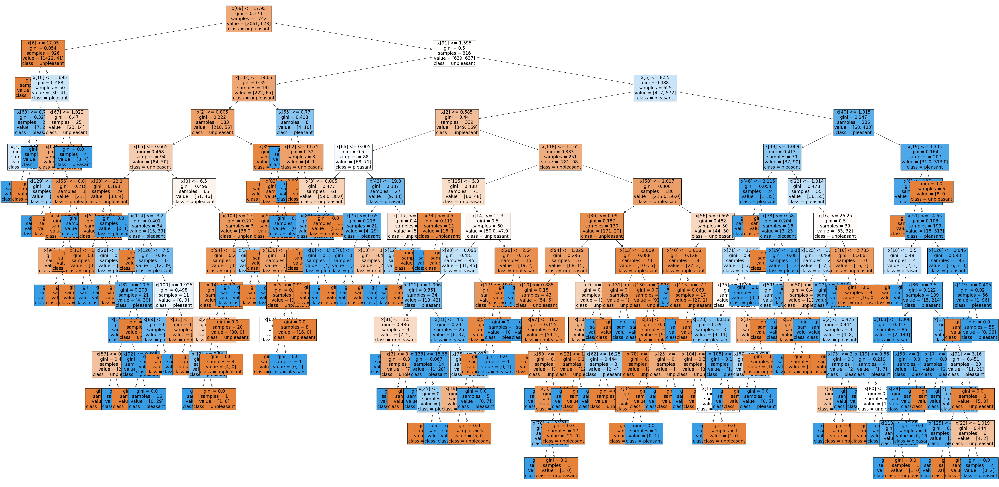

In [95]:
fig = plt.figure(figsize=(80, 40))

# clf.estimators_[0] is the RF model for first output (e.g., BASEL)
# Select the first tree inside that forest:
tree = clf.estimators_[0].estimators_[0]

plot_tree(tree, fontsize=20, class_names=['unpleasant', 'pleasant'], filled=True)

plt.show()

In [97]:
# Get the feature importances for each output model
importances = np.array([est.feature_importances_ for est in clf.estimators_])
# Reshape to (-1, 15, 9) — 15 models × 15 stations × 9 features
important = importances.reshape(-1, 15, 9)
station_importance = np.sum(important[0], axis=1)

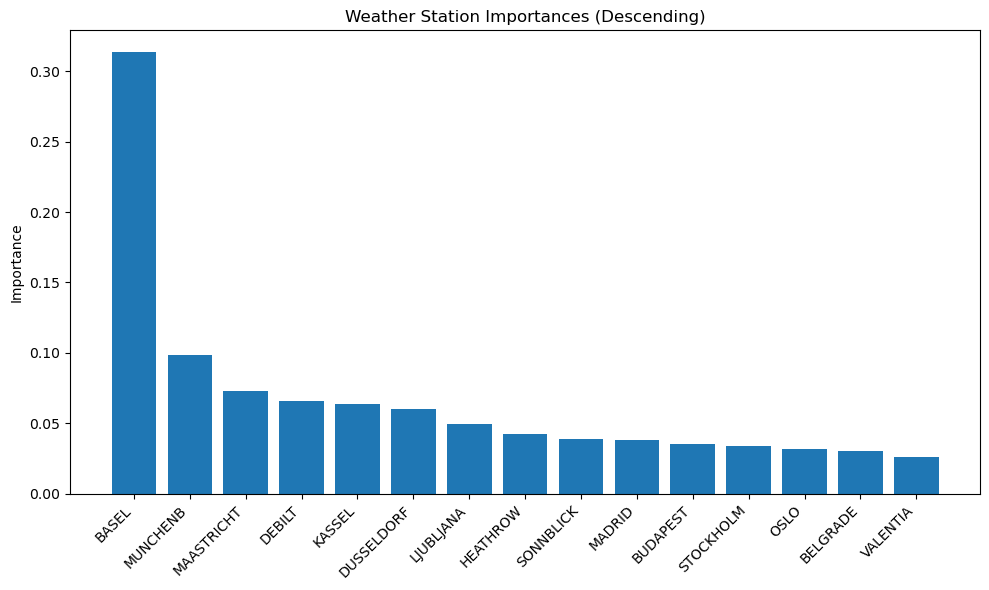

In [98]:
station_names = [col.replace('_pleasant_weather', '') for col in df_test_decade.columns]

# Sort by importance
sorted_indices = np.argsort(station_importance)[::-1]  # descending
sorted_importance = station_importance[sorted_indices]
sorted_names = np.array(station_names)[sorted_indices]

plt.figure(figsize=(10, 6))
plt.bar(sorted_names, sorted_importance)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Importance')
plt.title('Weather Station Importances (Descending)')
plt.tight_layout()
plt.show()

#### Basel

In [102]:
df = pd.read_csv(os.path.join(path, 'Dataset-weather-prediction-dataset-processed_cleaned.csv'))

In [104]:
# Create a subset of the full data with observations only from Basel station
basel = df[[col for col in df.columns if 'BASEL_' in col]]

In [106]:
basel

,BASEL_cloud_cover,BASEL_global_radiation,BASEL_humidity,BASEL_precipitation,BASEL_pressure,BASEL_sunshine,BASEL_temp_max,BASEL_temp_mean,BASEL_temp_min
0,7,0.32,0.85,0.09,1.0180,0.7,10.9,6.5,0.8
1,6,0.36,0.84,1.05,1.0180,1.1,10.1,6.1,3.3
2,8,0.18,0.90,0.30,1.0180,0.0,9.9,8.5,5.1
3,3,0.58,0.92,0.00,1.0180,4.1,10.6,6.3,3.8
4,6,0.65,0.95,0.14,1.0180,5.4,6.0,3.0,-0.7
...,...,...,...,...,...,...,...,...,...
22945,1,1.34,0.79,0.22,1.0248,7.7,21.4,15.9,11.4
22946,6,1.34,0.77,0.22,1.0244,5.4,21.9,16.7,14.3
22947,4,1.34,0.76,0.22,1.0227,6.1,22.4,16.7,13.1
22948,5,1.34,0.80,0.22,1.0212,5.8,21.1,15.4,11.6


In [108]:
y = df_test.drop(columns=['DATE'], errors='ignore')
y = np.array(y) 
y = y.max(axis=1)

In [110]:
X = np.array(basel)

In [112]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [114]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [118]:
# Train Random Forest - GRID SEARCH params
clf = RandomForestClassifier(max_depth=15, max_features=25, min_samples_leaf=1, min_samples_split=3, n_estimators=200) 
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, max_features=25, min_samples_split=3,
                       n_estimators=200)

In [120]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.9039735099337748


[Text(0.5333887358249481, 0.96875, 'x[7] <= 8.55\ngini = 0.478\nsamples = 10915\nvalue = [6785, 10427]\nclass = pleasant'),
 Text(0.25230594154288455, 0.90625, 'x[7] <= 4.85\ngini = 0.258\nsamples = 4505\nvalue = [6066, 1089]\nclass = unpleasant'),
 Text(0.10301369589522441, 0.84375, 'x[7] <= 3.35\ngini = 0.092\nsamples = 2780\nvalue = [4194.0, 214.0]\nclass = unpleasant'),
 Text(0.058477080338604055, 0.78125, 'x[3] <= 5.13\ngini = 0.044\nsamples = 2114\nvalue = [3290, 75]\nclass = unpleasant'),
 Text(0.05719932918064207, 0.71875, 'x[1] <= 1.355\ngini = 0.042\nsamples = 2113\nvalue = [3290, 72]\nclass = unpleasant'),
 Text(0.023997763935473565, 0.65625, 'x[7] <= 1.95\ngini = 0.029\nsamples = 1992\nvalue = [3114, 46]\nclass = unpleasant'),
 Text(0.009822712026832775, 0.59375, 'x[2] <= 0.975\ngini = 0.008\nsamples = 1477\nvalue = [2335, 10]\nclass = unpleasant'),
 Text(0.00590959910557419, 0.53125, 'x[4] <= 1.02\ngini = 0.007\nsamples = 1454\nvalue = [2302, 8]\nclass = unpleasant'),
 Tex

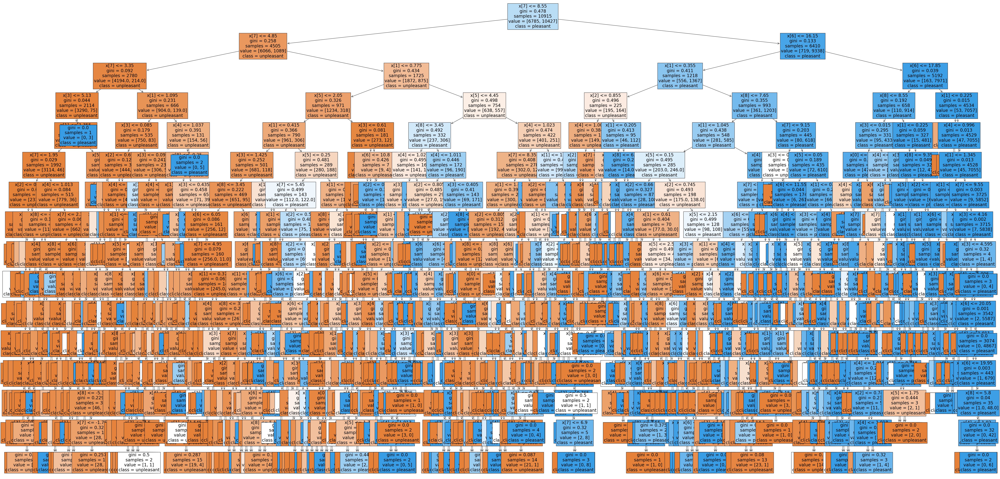

In [122]:
# Plot one tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[3], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True)

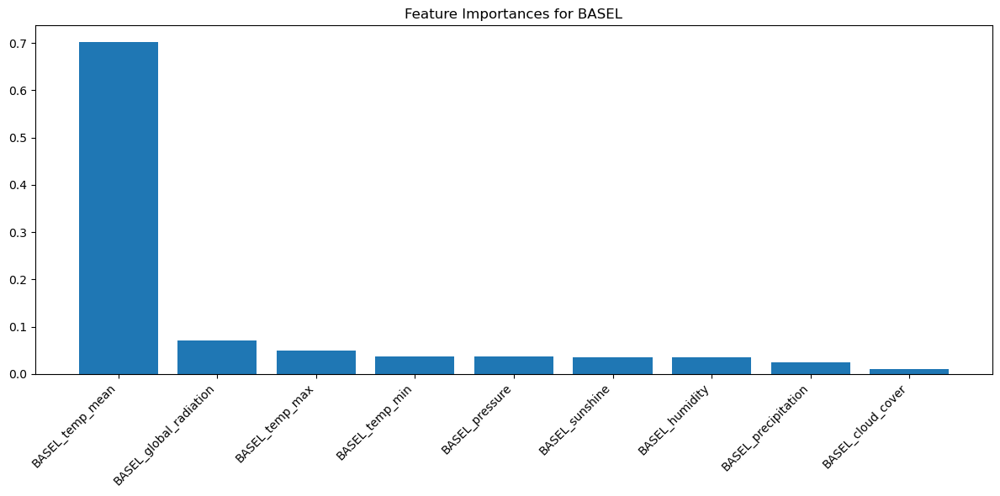

In [124]:
# Feature importance
importances = clf.feature_importances_
feature_names = basel.columns

# Sort by importance
indices = np.argsort(importances)[::-1]

# Plot
plt.figure(figsize=(12, 6))
plt.title("Feature Importances for BASEL")
plt.bar(range(len(importances)), importances[indices])
plt.xticks(range(len(importances)), feature_names[indices], rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### MunchenB

In [127]:
# Create a subset of the full data with observations only from MunchenB station
munch = df[[col for col in df.columns if 'MUNCHENB_' in col]]

In [129]:
munch

,MUNCHENB_cloud_cover,MUNCHENB_global_radiation,MUNCHENB_humidity,MUNCHENB_precipitation,MUNCHENB_pressure,MUNCHENB_sunshine,MUNCHENB_temp_max,MUNCHENB_temp_mean,MUNCHENB_temp_min
0,5,0.20,0.67,0.10,1.0304,0.0,10.4,6.9,1.1
1,6,0.61,0.72,0.30,1.0292,5.1,10.2,6.2,4.2
2,6,0.20,0.91,0.30,1.0320,0.0,8.0,5.8,4.0
3,6,0.20,0.90,0.01,1.0443,0.0,5.4,3.9,3.2
4,5,0.65,0.85,0.96,1.0430,5.6,6.0,1.8,-3.0
...,...,...,...,...,...,...,...,...,...
22945,2,1.37,0.76,0.26,1.0263,9.7,22.2,14.3,8.3
22946,6,1.37,0.70,0.26,1.0263,7.7,26.1,16.1,8.9
22947,7,1.37,0.64,0.26,1.0263,6.8,26.2,17.4,11.2
22948,6,1.37,0.75,0.26,1.0263,8.3,23.5,14.5,9.2


In [131]:
y = df_test.drop(columns=['DATE'], errors='ignore')
y = np.array(y) 
y = y.max(axis=1)

In [133]:
X = np.array(munch)

In [135]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [137]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [139]:
# Train Random Forest - GRID SEARCH params
clf = RandomForestClassifier(max_depth=15, max_features=25, min_samples_leaf=1, min_samples_split=3, n_estimators=200) 
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, max_features=25, min_samples_split=3,
                       n_estimators=200)

In [141]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.9126873475078424


[Text(0.5726775778125544, 0.96875, 'x[7] <= 7.55\ngini = 0.476\nsamples = 10889\nvalue = [6739, 10473]\nclass = pleasant'),
 Text(0.31898392670839854, 0.90625, 'x[7] <= 4.75\ngini = 0.286\nsamples = 4642\nvalue = [6081, 1271]\nclass = unpleasant'),
 Text(0.14793894540079985, 0.84375, 'x[7] <= 1.75\ngini = 0.163\nsamples = 3452\nvalue = [4964, 488]\nclass = unpleasant'),
 Text(0.06975417318727178, 0.78125, 'x[1] <= 2.06\ngini = 0.068\nsamples = 2202\nvalue = [3368, 124]\nclass = unpleasant'),
 Text(0.04700269518344636, 0.71875, 'x[8] <= -1.45\ngini = 0.064\nsamples = 2193\nvalue = [3365, 115]\nclass = unpleasant'),
 Text(0.023300295600765086, 0.65625, 'x[3] <= 3.505\ngini = 0.033\nsamples = 1736\nvalue = [2718, 47]\nclass = unpleasant'),
 Text(0.02190923317683881, 0.59375, 'x[1] <= 1.765\ngini = 0.032\nsamples = 1735\nvalue = [2718, 45]\nclass = unpleasant'),
 Text(0.0132150930272996, 0.53125, 'x[2] <= 0.495\ngini = 0.027\nsamples = 1713\nvalue = [2693, 37]\nclass = unpleasant'),
 Text(

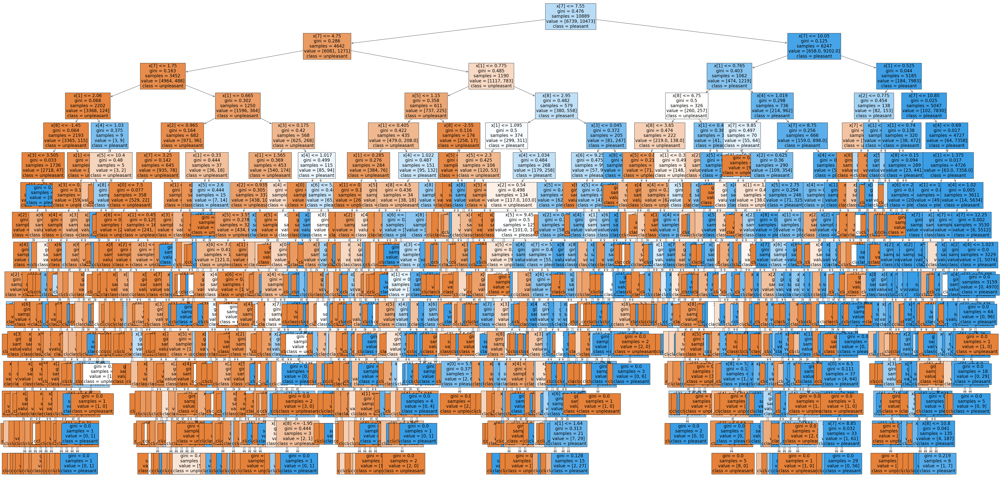

In [143]:
# Plot one tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[3], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True)

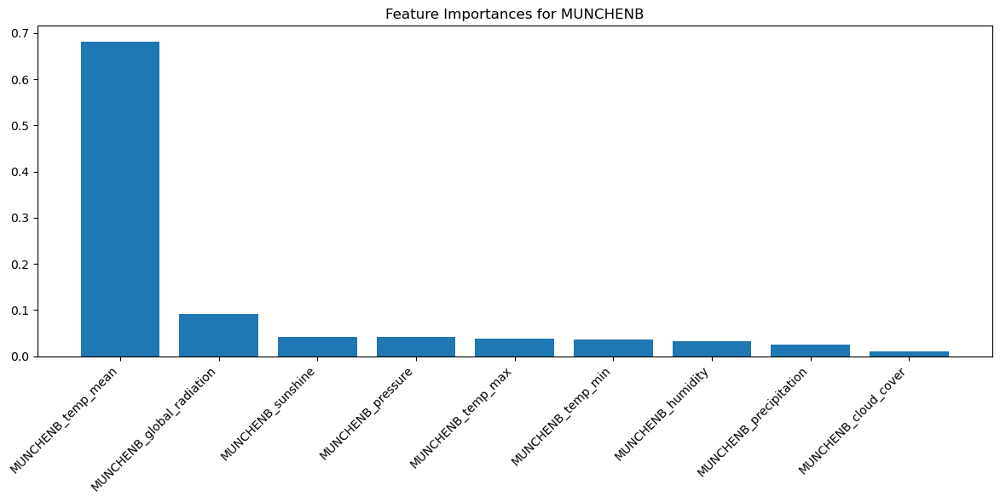

In [148]:
# Feature importance
importances = clf.feature_importances_
feature_names = munch.columns

# Sort by importance
indices = np.argsort(importances)[::-1]

# Plot
plt.figure(figsize=(12, 6))
plt.title("Feature Importances for MUNCHENB")
plt.bar(range(len(importances)), importances[indices])
plt.xticks(range(len(importances)), feature_names[indices], rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### Maastricht

In [150]:
# Create a subset of the full data with observations only from Maastricht station
mast = df[[col for col in df.columns if 'MAASTRICHT_' in col]]

In [152]:
mast

,MAASTRICHT_cloud_cover,MAASTRICHT_global_radiation,MAASTRICHT_humidity,MAASTRICHT_precipitation,MAASTRICHT_pressure,MAASTRICHT_sunshine,MAASTRICHT_temp_max,MAASTRICHT_temp_mean,MAASTRICHT_temp_min
0,7,0.22,0.83,0.32,1.0063,1.0,11.1,9.5,8.5
1,8,0.17,0.92,1.34,1.0062,0.4,9.9,8.6,7.5
2,7,0.12,0.97,0.46,1.0167,0.0,9.9,6.9,5.5
3,7,0.16,0.89,0.00,1.0277,0.3,10.0,7.0,3.0
4,7,0.12,0.92,0.56,1.0259,0.0,11.1,8.1,2.5
...,...,...,...,...,...,...,...,...,...
22945,8,1.17,0.67,0.20,1.0201,5.3,22.6,18.6,14.1
22946,7,1.17,0.70,0.20,1.0190,5.0,23.5,18.9,15.8
22947,8,1.17,0.69,0.20,1.0183,3.2,24.3,18.2,13.7
22948,8,1.17,0.73,0.20,1.0181,6.8,21.4,16.3,12.8


In [154]:
y = df_test.drop(columns=['DATE'], errors='ignore')
y = np.array(y) 
y = y.max(axis=1)

In [156]:
X = np.array(mast)

In [158]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [160]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [162]:
# Train Random Forest - GRID SEARCH params
clf = RandomForestClassifier(max_depth=15, max_features=25, min_samples_leaf=1, min_samples_split=3, n_estimators=200) 
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, max_features=25, min_samples_split=3,
                       n_estimators=200)

In [164]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.9027535726734054


[Text(0.5473453004410144, 0.96875, 'x[6] <= 12.95\ngini = 0.476\nsamples = 10790\nvalue = [6722, 10490]\nclass = pleasant'),
 Text(0.25781307423741273, 0.90625, 'x[6] <= 9.25\ngini = 0.322\nsamples = 4842\nvalue = [6110, 1543]\nclass = unpleasant'),
 Text(0.107054506615215, 0.84375, 'x[6] <= 6.85\ngini = 0.16\nsamples = 3126\nvalue = [4518, 433]\nclass = unpleasant'),
 Text(0.04465499816244028, 0.78125, 'x[1] <= 0.865\ngini = 0.071\nsamples = 2054\nvalue = [3121, 119]\nclass = unpleasant'),
 Text(0.016175119441381846, 0.71875, 'x[8] <= -1.55\ngini = 0.051\nsamples = 1845\nvalue = [2841, 76]\nclass = unpleasant'),
 Text(0.004704152884968761, 0.65625, 'x[7] <= 0.75\ngini = 0.003\nsamples = 788\nvalue = [1270, 2]\nclass = unpleasant'),
 Text(0.0035281146637265713, 0.59375, 'gini = 0.0\nsamples = 673\nvalue = [1094, 0]\nclass = unpleasant'),
 Text(0.005880191106210952, 0.59375, 'x[1] <= 0.77\ngini = 0.022\nsamples = 115\nvalue = [176, 2]\nclass = unpleasant'),
 Text(0.0035281146637265713, 

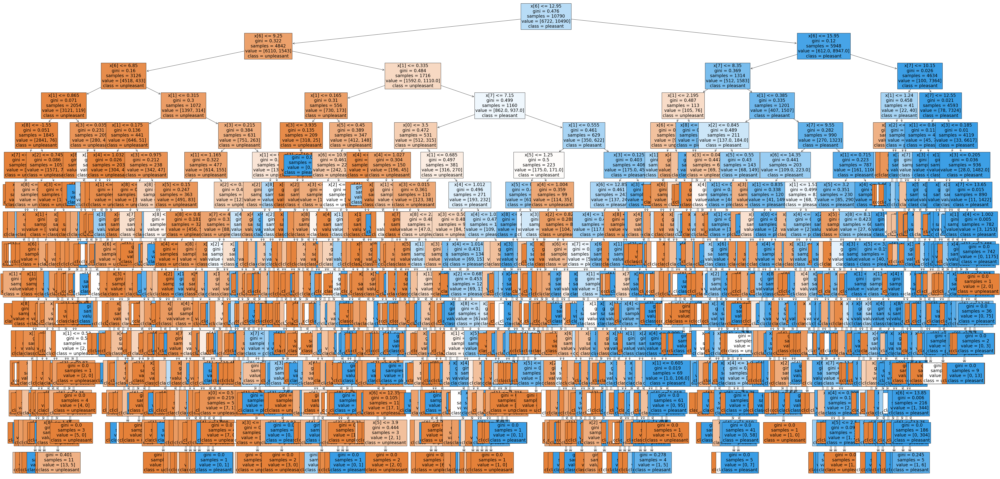

In [166]:
# Plot one tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[3], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True)

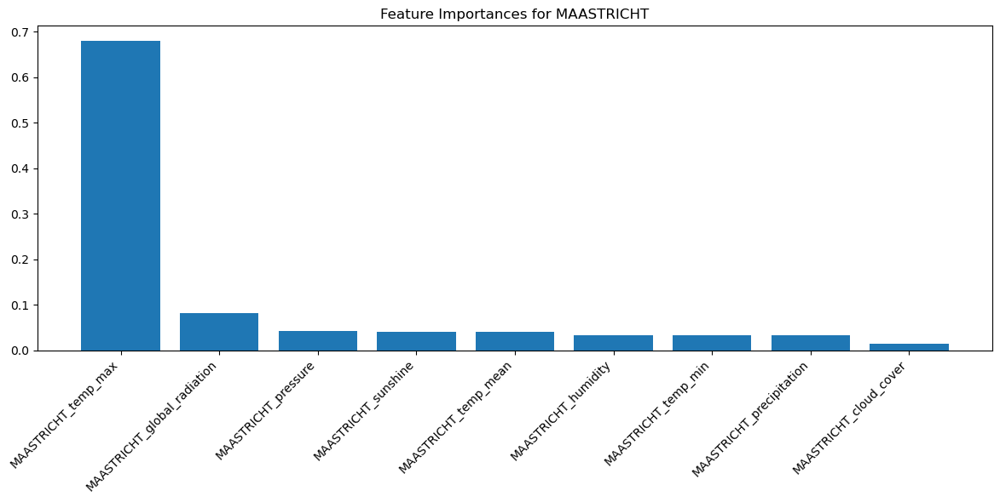

In [168]:
# Feature importance
importances = clf.feature_importances_
feature_names = mast.columns

# Sort by importance
indices = np.argsort(importances)[::-1]

# Plot
plt.figure(figsize=(12, 6))
plt.title("Feature Importances for MAASTRICHT")
plt.bar(range(len(importances)), importances[indices])
plt.xticks(range(len(importances)), feature_names[indices], rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Create Deep Learning model + optimization

In [292]:
X = pd.read_csv(os.path.join(path, 'Dataset-weather-prediction-dataset-processed_cleaned.csv'))
y = df_test.drop(columns=['DATE'], errors='ignore')

In [294]:
X

,BASEL_cloud_cover,BASEL_global_radiation,BASEL_humidity,BASEL_precipitation,BASEL_pressure,BASEL_sunshine,BASEL_temp_max,BASEL_temp_mean,BASEL_temp_min,BELGRADE_cloud_cover,BELGRADE_global_radiation,BELGRADE_humidity,BELGRADE_precipitation,BELGRADE_pressure,BELGRADE_sunshine,BELGRADE_temp_max,BELGRADE_temp_mean,BELGRADE_temp_min,BUDAPEST_cloud_cover,BUDAPEST_global_radiation,BUDAPEST_humidity,BUDAPEST_precipitation,BUDAPEST_pressure,BUDAPEST_sunshine,BUDAPEST_temp_max,BUDAPEST_temp_mean,BUDAPEST_temp_min,DEBILT_cloud_cover,DEBILT_global_radiation,DEBILT_humidity,DEBILT_precipitation,DEBILT_pressure,DEBILT_sunshine,DEBILT_temp_max,DEBILT_temp_mean,DEBILT_temp_min,DUSSELDORF_cloud_cover,DUSSELDORF_global_radiation,DUSSELDORF_humidity,DUSSELDORF_precipitation,DUSSELDORF_pressure,DUSSELDORF_sunshine,DUSSELDORF_temp_max,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,HEATHROW_cloud_cover,HEATHROW_global_radiation,HEATHROW_humidity,HEATHROW_precipitation,HEATHROW_pressure,HEATHROW_sunshine,HEATHROW_temp_max,HEATHROW_temp_mean,HEATHROW_temp_min,KASSEL_cloud_cover,KASSEL_global_radiation,KASSEL_humidity,KASSEL_precipitation,KASSEL_pressure,KASSEL_sunshine,KASSEL_temp_max,KASSEL_temp_mean,KASSEL_temp_min,LJUBLJANA_cloud_cover,LJUBLJANA_global_radiation,LJUBLJANA_humidity,LJUBLJANA_precipitation,LJUBLJANA_pressure,LJUBLJANA_sunshine,LJUBLJANA_temp_max,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,MAASTRICHT_cloud_cover,MAASTRICHT_global_radiation,MAASTRICHT_humidity,MAASTRICHT_precipitation,MAASTRICHT_pressure,MAASTRICHT_sunshine,MAASTRICHT_temp_max,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MADRID_cloud_cover,MADRID_global_radiation,MADRID_humidity,MADRID_precipitation,MADRID_pressure,MADRID_sunshine,MADRID_temp_max,MADRID_temp_mean,MADRID_temp_min,MUNCHENB_cloud_cover,MUNCHENB_global_radiation,MUNCHENB_humidity,MUNCHENB_precipitation,MUNCHENB_pressure,MUNCHENB_sunshine,MUNCHENB_temp_max,MUNCHENB_temp_mean,MUNCHENB_temp_min,OSLO_cloud_cover,OSLO_global_radiation,OSLO_humidity,OSLO_precipitation,OSLO_pressure,OSLO_sunshine,OSLO_temp_max,OSLO_temp_mean,OSLO_temp_min,SONNBLICK_cloud_cover,SONNBLICK_global_radiation,SONNBLICK_humidity,SONNBLICK_precipitation,SONNBLICK_pressure,SONNBLICK_sunshine,SONNBLICK_temp_max,SONNBLICK_temp_mean,SONNBLICK_temp_min,STOCKHOLM_cloud_cover,STOCKHOLM_global_radiation,STOCKHOLM_humidity,STOCKHOLM_precipitation,STOCKHOLM_pressure,STOCKHOLM_sunshine,STOCKHOLM_temp_max,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,VALENTIA_cloud_cover,VALENTIA_global_radiation,VALENTIA_humidity,VALENTIA_precipitation,VALENTIA_pressure,VALENTIA_sunshine,VALENTIA_temp_max,VALENTIA_temp_mean,VALENTIA_temp_min
0,7,0.32,0.85,0.09,1.0180,0.7,10.9,6.5,0.8,1,0.88,0.81,0.00,1.0195,7.0,7.9,3.7,-0.9,4,0.44,0.67,0.01,1.017,2.3,5.1,2.4,-0.4,7,0.07,0.85,0.25,1.0032,0.0,11.0,9.3,7.4,8,0.12,0.83,0.08,1.0161,0.0,11.5,10.0,7.0,7,0.13,0.91,0.22,1.0010,0.0,8.3,10.6,9.4,8,0.28,0.82,0.48,1.0094,1.6,9.4,7.9,3.9,8,0.20,1.00,0.00,1.0173,0.0,0.5,-0.6,-1.9,7,0.22,0.83,0.32,1.0063,1.0,11.1,9.5,8.5,6,0.53,0.92,0.00,1.0260,1.4,10.8,7.6,4.4,5,0.20,0.67,0.10,1.0304,0.0,10.4,6.9,1.1,8,0.04,0.98,1.14,0.9978,0.0,5.9,4.9,3.8,4,0.48,0.73,0.01,1.0304,2.3,-3.2,-5.9,-8.5,5,0.05,0.98,0.32,1.0114,0.0,4.9,4.2,2.2,5,0.45,0.88,0.34,1.0003,4.7,10.9,8.5,6.0
1,6,0.36,0.84,1.05,1.0180,1.1,10.1,6.1,3.3,6,0.25,0.84,0.00,1.0172,0.0,4.4,2.9,2.2,4,0.18,0.67,0.31,1.017,0.0,3.1,2.3,1.4,8,0.14,0.90,0.06,1.0056,0.1,8.3,7.7,6.4,8,0.18,0.89,0.66,1.0161,0.5,11.0,8.2,7.4,7,0.13,0.98,0.23,1.0051,0.0,10.6,6.1,3.9,6,0.12,0.86,0.27,1.0086,0.0,9.1,7.7,6.8,6,0.56,0.94,0.13,1.0173,3.2,5.5,2.1,-1.3,8,0.17,0.92,1.34,1.0062,0.4,9.9,8.6,7.5,7,0.46,0.86,0.00,1.0254,0.9,12.2,9.8,7.4,6,0.61,0.72,0.30,1.0292,5.1,10.2,6.2,4.2,8,0.04,0.62,0.00,1.0139,0.0,4.9,3.4,2.8,6,0.21,0.97,0.61,1.0292,0.0,-8.5,-9.5,-10.5,5,0.05,0.62,0.06,1.0114,0.0,5.0,4.0,3.0,7,0.25,0.91,0.84,1.0007,0.7,12.1,8.9,5.6
2,8,0.18,0.90,0.30,1.0180,0.0,9.9,8.5,5.1,6,0.67,0.77,0.00,1.0179,3.5,6.4,3.1,-0.5,4,0.30,0.67,0.00,1.017,0.6,5.3,2.7,1.7,6,0.28,0.92,0.01,

In [296]:
y

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [298]:
# Convert X and y to arrays
X = np.array(X)
y = np.array(y)

In [300]:
# Reshape
X = X.reshape(-1,15,9)

In [320]:
#Use argmax to get rid of one-hot encoding and supply the numerical value.
y = np.argmax(y, axis = 1)

In [302]:
X.shape

(22950, 15, 9)

In [322]:
y.shape

(22950,)

In [324]:
# Check y layout
from sklearn.utils.multiclass import type_of_target
type_of_target(y)

'multiclass'

In [332]:
y.max()

14

In [328]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [330]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 15, 9) (17212,)
(5738, 15, 9) (5738,)


#### Bayesian optimization

In [312]:
timesteps = len(X_train[0])
input_dim = len(X_train[0][0])
n_classes = 15 #_count_classes(Y_train)
# Make scorer accuracy
score_acc = make_scorer(accuracy_score)

In [314]:
# Create function
def bay_area(neurons, activation, kernel, optimizer, learning_rate, batch_size, epochs,
              layers1, layers2, normalization, dropout, dropout_rate): 
    optimizerL = ['SGD', 'Adam', 'RMSprop', 'Adadelta', 'Adagrad', 'Adamax', 'Nadam', 'Ftrl','SGD']
    optimizerD= {'Adam':Adam(learning_rate=learning_rate), 'SGD':SGD(learning_rate=learning_rate),
                 'RMSprop':RMSprop(learning_rate=learning_rate), 'Adadelta':Adadelta(learning_rate=learning_rate),
                 'Adagrad':Adagrad(learning_rate=learning_rate), 'Adamax':Adamax(learning_rate=learning_rate),
                 'Nadam':Nadam(learning_rate=learning_rate), 'Ftrl':Ftrl(learning_rate=learning_rate)}
    activationL = ['relu', 'sigmoid', 'softplus', 'softsign', 'tanh', 'selu',
                   'elu', 'exponential', 'leaky_relu','relu']
    
    neurons = round(neurons)
    kernel = round(kernel)
    activation = activationL[round(activation)]
    optimizer = optimizerD[optimizerL[round(optimizer)]]
    batch_size = round(batch_size)
    
    epochs = round(epochs)
    layers1 = round(layers1)
    layers2 = round(layers2)
    
    def cnn_model():
        model = Sequential()
        model.add(Conv1D(neurons, kernel_size=kernel,activation=activation, input_shape=(timesteps, input_dim)))
        #model.add(Conv1D(32, kernel_size=1,activation='relu', input_shape=(timesteps, input_dim)))
        
        if normalization > 0.5:
            model.add(BatchNormalization())
        for i in range(layers1):
            model.add(Dense(neurons, activation=activation)) #(neurons, activation=activation))
        if dropout > 0.5:
            model.add(Dropout(dropout_rate, seed=123))
        for i in range(layers2):
            model.add(Dense(neurons, activation=activation))
        model.add(MaxPooling1D())
        model.add(Flatten())
        model.add(Dense(n_classes, activation='softmax')) #sigmoid softmax
        #model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy']) #categorical_crossentropy
        model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy']) #categorical_crossentropy
        return model
    es = EarlyStopping(monitor='accuracy', mode='max', verbose=2, patience=20)
    nn = KerasClassifier(build_fn=cnn_model, epochs=epochs, batch_size=batch_size, verbose=2)
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
    score = cross_val_score(nn, X_train, y_train, scoring=score_acc, cv=kfold, fit_params={'callbacks':[es]}).mean()
    return score

In [334]:
start = time.time()
params ={
    'neurons': (10, 100),
    'kernel': (1, 3),
    'activation':(0, 9), #9
    'optimizer':(0,7), #7
    'learning_rate':(0.01, 1),
    'batch_size': (200, 1000), #(10, 50), #
    'epochs':(20, 100),
    'layers1':(1,3),
    'layers2':(1,3),
    'normalization':(0,1),
    'dropout':(0,1),
    'dropout_rate':(0,0.3)
}

# Run Bayesian Optimization
nn_opt = BayesianOptimization(bay_area, params, random_state=42)
nn_opt.maximize(init_points=5, n_iter=5) #25
print('Search took %s minutes' % ((time.time() - start)/60))

|   iter    |  target   |  neurons  |  kernel   | activa... | optimizer | learni... | batch_... |  epochs   |  layers1  |  layers2  | normal... |  dropout  | dropou... |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch 1/25
43/43 - 6s - 139ms/step - accuracy: 0.6307 - loss: nan
Epoch 2/25
43/43 - 1s - 13ms/step - accuracy: 0.6440 - loss: nan
Epoch 3/25
43/43 - 1s - 13ms/step - accuracy: 0.6440 - loss: nan
Epoch 4/25
43/43 - 0s - 11ms/step - accuracy: 0.6440 - loss: nan
Epoch 5/25
43/43 - 1s - 14ms/step - accuracy: 0.6440 - loss: nan
Epoch 6/25
43/43 - 1s - 13ms/step - accuracy: 0.6440 - loss: nan
Epoch 7/25
43/43 - 1s - 12ms/step - accuracy: 0.6440 - loss: nan
Epoch 8/25
43/43 - 0s - 11ms/step - accuracy: 0.6440 - loss: nan
Epoch 9/25
43/43 - 0s - 11ms/step - accuracy: 0.6440 - loss: nan
Epoch 10/25
43/43 - 1s - 19ms/step - accuracy: 0.6440 - loss: nan
Epoch 11

ValueError: Input y contains NaN.

In [340]:
optimum = nn_opt.max['params']
learning_rate = optimum['learning_rate']
activationL = ['relu', 'sigmoid', 'softplus', 'softsign', 'tanh', 'selu',
               'elu', 'exponential', LeakyReLU,'relu']
optimum['activation'] = activationL[round(optimum['activation'])]
optimum['batch_size'] = round(optimum['batch_size'])
optimum['epochs'] = round(optimum['epochs'])
optimum['layers1'] = round(optimum['layers1'])
optimum['layers2'] = round(optimum['layers2'])
optimum['neurons'] = round(optimum['neurons'])
optimizerL = ['Adam', 'SGD', 'RMSprop', 'Adadelta', 'Adagrad', 'Adamax', 'Nadam', 'Ftrl','Adam']
optimizerD= {'Adam':Adam(learning_rate=learning_rate), 'SGD':SGD(learning_rate=learning_rate),
             'RMSprop':RMSprop(learning_rate=learning_rate), 'Adadelta':Adadelta(learning_rate=learning_rate),
             'Adagrad':Adagrad(learning_rate=learning_rate), 'Adamax':Adamax(learning_rate=learning_rate),
             'Nadam':Nadam(learning_rate=learning_rate), 'Ftrl':Ftrl(learning_rate=learning_rate)}
optimum['optimizer'] = optimizerD[optimizerL[round(optimum['optimizer'])]]
optimum

{'neurons': 44,
 'kernel': 2.9014286128198323,
 'activation': 'exponential',
 'optimizer': <keras.src.optimizers.adagrad.Adagrad at 0x29bd6111b10>,
 'learning_rate': 0.16445845403801215,
 'batch_size': 325,
 'epochs': 25,
 'layers1': 3,
 'layers2': 2,
 'normalization': 0.7080725777960455,
 'dropout': 0.020584494295802447,
 'dropout_rate': 0.29097295564859826}

In [374]:
# Apply the optimal params
epochs = 32
batch_size = 961
#n_hidden = 32

timesteps = len(X_train[0])
input_dim = len(X_train[0][0])
n_classes = 15 #_count_classes(Y_train)
layers1 = 1
layers2 = 2
activation = 'softsign'
kernel = 1
neurons = 74
normalization = 0.02058
dropout = 0.7320
dropout_rate = 0.1796
optimizer = 'Adadelta'

model = Sequential()
model.add(Conv1D(neurons, kernel_size=kernel, activation=activation, input_shape=(timesteps, input_dim)))
if normalization > 0.5:
    model.add(BatchNormalization())
for i in range(layers1):
        model.add(Dense(neurons, activation=activation))
if dropout > 0.5:
    model.add(Dropout(dropout_rate, seed=123))
for i in range(layers2):
    model.add(Dense(neurons, activation=activation))
model.add(MaxPooling1D())
model.add(Flatten())
model.add(Dense(n_classes, activation='softmax')) #softmax sigmoid
#model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy']) #binary_crossentropy

In [376]:
# Bring y_test set back into a one-hot encoding

y_train_oh = to_categorical(y_train, num_classes=15)

In [378]:
y_train_oh.shape

(17212, 15)

In [382]:
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [384]:
model.fit(X_train, y_train_oh, batch_size=batch_size, epochs=epochs, verbose=2)

Epoch 1/32
18/18 - 4s - 201ms/step - accuracy: 0.0568 - loss: 2.9099
Epoch 2/32
18/18 - 1s - 40ms/step - accuracy: 0.0565 - loss: 2.9021
Epoch 3/32
18/18 - 1s - 37ms/step - accuracy: 0.0593 - loss: 2.8953
Epoch 4/32
18/18 - 1s - 37ms/step - accuracy: 0.0593 - loss: 2.8884
Epoch 5/32
18/18 - 1s - 38ms/step - accuracy: 0.0613 - loss: 2.8817
Epoch 6/32
18/18 - 1s - 36ms/step - accuracy: 0.0609 - loss: 2.8735
Epoch 7/32
18/18 - 1s - 37ms/step - accuracy: 0.0589 - loss: 2.8676
Epoch 8/32
18/18 - 1s - 36ms/step - accuracy: 0.0618 - loss: 2.8604
Epoch 9/32
18/18 - 1s - 38ms/step - accuracy: 0.0621 - loss: 2.8539
Epoch 10/32
18/18 - 1s - 38ms/step - accuracy: 0.0622 - loss: 2.8455
Epoch 11/32
18/18 - 1s - 36ms/step - accuracy: 0.0658 - loss: 2.8378
Epoch 12/32
18/18 - 1s - 36ms/step - accuracy: 0.0656 - loss: 2.8315
Epoch 13/32
18/18 - 1s - 38ms/step - accuracy: 0.0659 - loss: 2.8238
Epoch 14/32
18/18 - 1s - 38ms/step - accuracy: 0.0665 - loss: 2.8163
Epoch 15/32
18/18 - 1s - 37ms/step - accur

In [358]:
stations = {
0: 'BASEL',
1: 'BELGRADE',
2: 'BUDAPEST',
3: 'DEBILT',
4: 'DUSSELDORF',
5: 'HEATHROW',
6: 'KASSEL',
7: 'LJUBLJANA',
8: 'MAASTRICHT',
9: 'MADRID',
10: 'MUNCHENB',
11: 'OSLO',
12: 'SONNBLICK',
13: 'STOCKHOLM',
14: 'VALENTIA'
}

In [388]:
def confusion_matrix(y_true, y_pred, stations):
    # Check if y_true and y_pred are one-hot encoded or already class indices
    if y_true.ndim == 1:
        y_true_labels = y_true
    else:
        y_true_labels = np.argmax(y_true, axis=1)
    
    if y_pred.ndim == 1:
        y_pred_labels = y_pred
    else:
        y_pred_labels = np.argmax(y_pred, axis=1)
        
    # Map numeric labels to activity names
    y_true_series = pd.Series([stations[y] for y in y_true_labels])
    y_pred_series = pd.Series([stations[y] for y in y_pred_labels])

    # Create confusion matrix
    return pd.crosstab(y_true_series, y_pred_series, rownames=['True'], colnames=['Pred'])

In [390]:
# Evaluate
print(confusion_matrix(y_test, model.predict(X_test), stations))

180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Pred        BASEL  BELGRADE  BUDAPEST  DUSSELDORF  HEATHROW  KASSEL  \
True                                                                  
BASEL           2       450         6          41         4       5   
BELGRADE        2       301         0           7         0       4   
BUDAPEST        0        23         0           4         0       0   
DEBILT          0        10         0           0         0       0   
DUSSELDORF      0         1         0           1         0       0   
HEATHROW        0         2         0           3         0       0   
KASSEL          0         2         0           0         0       0   
LJUBLJANA       0         0         0           1         0       3   
MAASTRICHT      0         0         0           0         0       0   
MADRID          0         6         0           3         0       0   
MUNCHENB        0         0         0           0         0       0   
OSLO            0         0         